# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

SVHN Training Set: 182MB [00:18, 9.59MB/s]                              
SVHN Testing Set: 64.3MB [00:06, 9.43MB/s]                            


These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

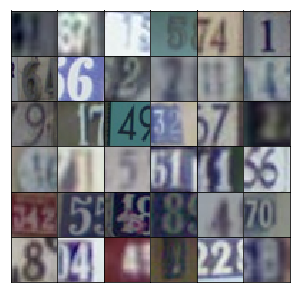

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a 
sed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        # 8x8x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        # 32x32x3 now
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [10]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [11]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [13]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=0.2)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [14]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [15]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [ ]:
real_size = (32,32,3)
z_size = 100
learning_rate =  0.0002
batch_size = 128
epochs = 10
alpha = 0.01
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/10... Discriminator Loss: 1.3096... Generator Loss: 0.6383
Epoch 1/10... Discriminator Loss: 0.4768... Generator Loss: 1.5189
Epoch 1/10... Discriminator Loss: 0.1300... Generator Loss: 2.8072
Epoch 1/10... Discriminator Loss: 0.1341... Generator Loss: 2.9318
Epoch 1/10... Discriminator Loss: 0.1564... Generator Loss: 2.9138
Epoch 1/10... Discriminator Loss: 0.1142... Generator Loss: 2.8874
Epoch 1/10... Discriminator Loss: 0.1856... Generator Loss: 3.3958
Epoch 1/10... Discriminator Loss: 0.2312... Generator Loss: 3.0888
Epoch 1/10... Discriminator Loss: 0.1670... Generator Loss: 3.0912
Epoch 1/10... Discriminator Loss: 0.1897... Generator Loss: 2.6267


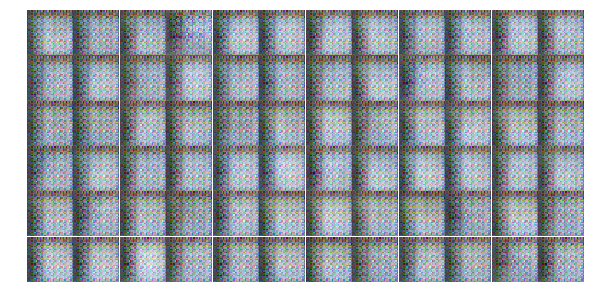

Epoch 1/10... Discriminator Loss: 0.3781... Generator Loss: 1.9653
Epoch 1/10... Discriminator Loss: 0.4974... Generator Loss: 1.8737
Epoch 1/10... Discriminator Loss: 0.3920... Generator Loss: 2.0764
Epoch 1/10... Discriminator Loss: 0.3202... Generator Loss: 2.1222
Epoch 1/10... Discriminator Loss: 0.5411... Generator Loss: 1.8519
Epoch 1/10... Discriminator Loss: 0.4060... Generator Loss: 2.0547
Epoch 1/10... Discriminator Loss: 0.2351... Generator Loss: 2.1710
Epoch 1/10... Discriminator Loss: 0.5028... Generator Loss: 2.5304
Epoch 1/10... Discriminator Loss: 0.7369... Generator Loss: 2.3590
Epoch 1/10... Discriminator Loss: 0.4290... Generator Loss: 1.7553


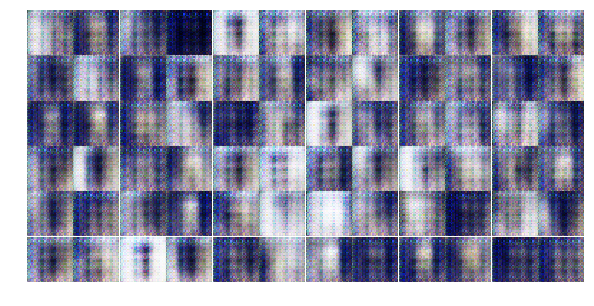

Epoch 1/10... Discriminator Loss: 1.2534... Generator Loss: 0.4823
Epoch 1/10... Discriminator Loss: 0.3098... Generator Loss: 3.7704
Epoch 1/10... Discriminator Loss: 1.8634... Generator Loss: 0.6394
Epoch 1/10... Discriminator Loss: 0.4522... Generator Loss: 2.8927
Epoch 1/10... Discriminator Loss: 0.4871... Generator Loss: 2.1750
Epoch 1/10... Discriminator Loss: 0.3688... Generator Loss: 1.7488
Epoch 1/10... Discriminator Loss: 0.7386... Generator Loss: 1.2466
Epoch 1/10... Discriminator Loss: 0.3283... Generator Loss: 4.8623
Epoch 1/10... Discriminator Loss: 0.7555... Generator Loss: 0.9792
Epoch 1/10... Discriminator Loss: 0.3481... Generator Loss: 2.0341


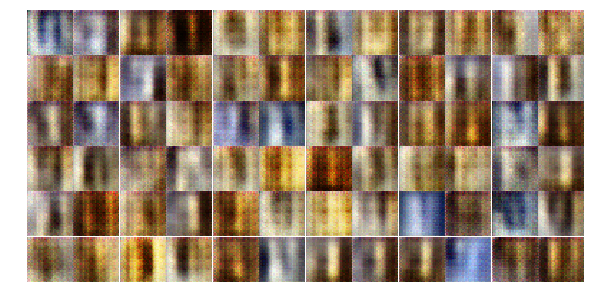

Epoch 1/10... Discriminator Loss: 1.4403... Generator Loss: 4.2649
Epoch 1/10... Discriminator Loss: 0.6873... Generator Loss: 3.6488
Epoch 1/10... Discriminator Loss: 0.1990... Generator Loss: 3.1117
Epoch 1/10... Discriminator Loss: 0.4675... Generator Loss: 1.4003
Epoch 1/10... Discriminator Loss: 0.2905... Generator Loss: 2.0051
Epoch 1/10... Discriminator Loss: 0.5933... Generator Loss: 4.0737
Epoch 1/10... Discriminator Loss: 0.4748... Generator Loss: 1.6728
Epoch 1/10... Discriminator Loss: 0.8508... Generator Loss: 3.8188
Epoch 1/10... Discriminator Loss: 0.5325... Generator Loss: 1.6756
Epoch 1/10... Discriminator Loss: 0.2155... Generator Loss: 3.0463


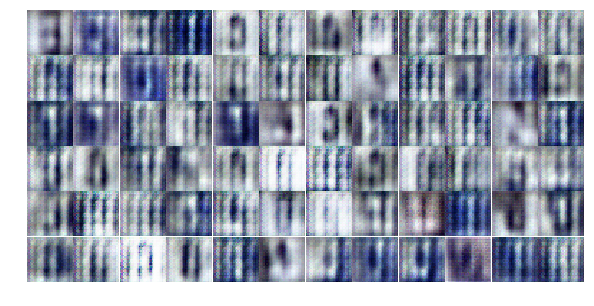

Epoch 1/10... Discriminator Loss: 0.5760... Generator Loss: 1.6581
Epoch 1/10... Discriminator Loss: 0.4795... Generator Loss: 1.6809
Epoch 1/10... Discriminator Loss: 0.7407... Generator Loss: 0.9567
Epoch 1/10... Discriminator Loss: 0.4586... Generator Loss: 1.3626
Epoch 1/10... Discriminator Loss: 0.4724... Generator Loss: 3.2081
Epoch 1/10... Discriminator Loss: 0.5474... Generator Loss: 1.4471
Epoch 1/10... Discriminator Loss: 1.2125... Generator Loss: 0.5331
Epoch 1/10... Discriminator Loss: 0.5034... Generator Loss: 2.0173
Epoch 1/10... Discriminator Loss: 0.8344... Generator Loss: 0.8520
Epoch 1/10... Discriminator Loss: 0.6288... Generator Loss: 1.2821


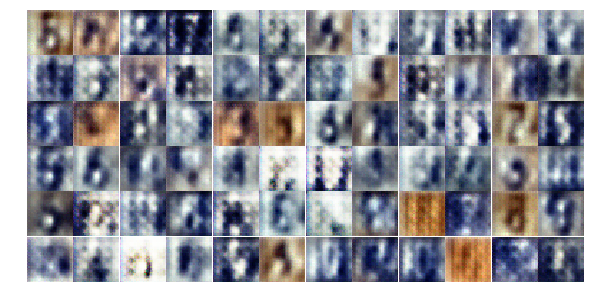

Epoch 1/10... Discriminator Loss: 0.6671... Generator Loss: 1.6519
Epoch 1/10... Discriminator Loss: 1.3861... Generator Loss: 0.5838
Epoch 1/10... Discriminator Loss: 0.4173... Generator Loss: 1.8417
Epoch 1/10... Discriminator Loss: 0.5050... Generator Loss: 1.3964
Epoch 1/10... Discriminator Loss: 0.7448... Generator Loss: 2.2036
Epoch 1/10... Discriminator Loss: 0.8866... Generator Loss: 0.9076
Epoch 1/10... Discriminator Loss: 0.4285... Generator Loss: 1.9782
Epoch 2/10... Discriminator Loss: 0.8714... Generator Loss: 2.1831
Epoch 2/10... Discriminator Loss: 0.5067... Generator Loss: 1.7889
Epoch 2/10... Discriminator Loss: 0.6308... Generator Loss: 1.4969


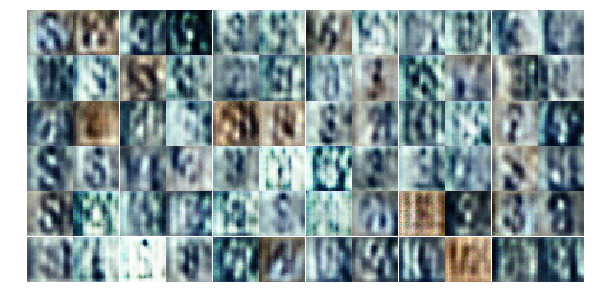

Epoch 2/10... Discriminator Loss: 0.9087... Generator Loss: 0.7945
Epoch 2/10... Discriminator Loss: 1.1493... Generator Loss: 0.6650
Epoch 2/10... Discriminator Loss: 0.6173... Generator Loss: 1.7934
Epoch 2/10... Discriminator Loss: 0.6807... Generator Loss: 1.8403
Epoch 2/10... Discriminator Loss: 0.9978... Generator Loss: 0.7623
Epoch 2/10... Discriminator Loss: 0.6240... Generator Loss: 1.2686
Epoch 2/10... Discriminator Loss: 1.0907... Generator Loss: 2.3824
Epoch 2/10... Discriminator Loss: 1.0427... Generator Loss: 0.7538
Epoch 2/10... Discriminator Loss: 0.6200... Generator Loss: 1.9160
Epoch 2/10... Discriminator Loss: 0.8442... Generator Loss: 1.3055


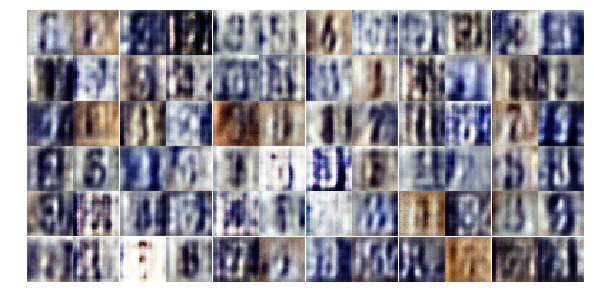

Epoch 2/10... Discriminator Loss: 0.6058... Generator Loss: 1.4835
Epoch 2/10... Discriminator Loss: 0.5260... Generator Loss: 1.5349
Epoch 2/10... Discriminator Loss: 0.6652... Generator Loss: 1.4704
Epoch 2/10... Discriminator Loss: 0.7540... Generator Loss: 1.1383
Epoch 2/10... Discriminator Loss: 1.0187... Generator Loss: 1.3146
Epoch 2/10... Discriminator Loss: 0.8236... Generator Loss: 1.2139
Epoch 2/10... Discriminator Loss: 1.1181... Generator Loss: 0.7033
Epoch 2/10... Discriminator Loss: 0.9588... Generator Loss: 0.9165
Epoch 2/10... Discriminator Loss: 1.0517... Generator Loss: 0.8095
Epoch 2/10... Discriminator Loss: 1.2816... Generator Loss: 0.5468


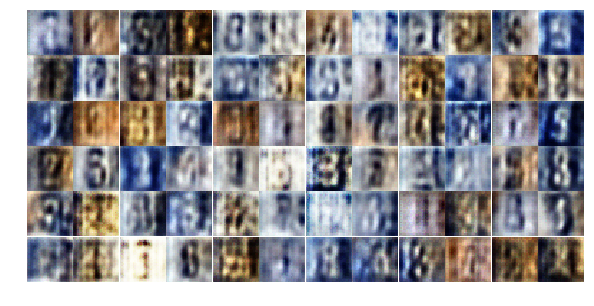

Epoch 2/10... Discriminator Loss: 0.9559... Generator Loss: 1.0229
Epoch 2/10... Discriminator Loss: 0.6594... Generator Loss: 1.4652
Epoch 2/10... Discriminator Loss: 1.0034... Generator Loss: 1.1259
Epoch 2/10... Discriminator Loss: 1.2211... Generator Loss: 0.6554
Epoch 2/10... Discriminator Loss: 0.8356... Generator Loss: 1.3492
Epoch 2/10... Discriminator Loss: 1.1328... Generator Loss: 0.7286
Epoch 2/10... Discriminator Loss: 1.1678... Generator Loss: 0.5357
Epoch 2/10... Discriminator Loss: 0.9724... Generator Loss: 0.9033
Epoch 2/10... Discriminator Loss: 1.3470... Generator Loss: 0.6308
Epoch 2/10... Discriminator Loss: 0.8185... Generator Loss: 1.3459


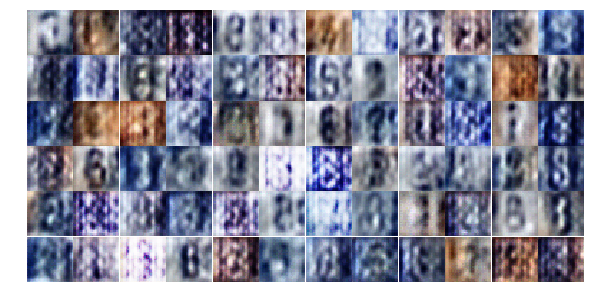

Epoch 2/10... Discriminator Loss: 0.4596... Generator Loss: 1.7369
Epoch 2/10... Discriminator Loss: 0.6542... Generator Loss: 1.4503
Epoch 2/10... Discriminator Loss: 1.5450... Generator Loss: 0.4458
Epoch 2/10... Discriminator Loss: 1.4633... Generator Loss: 0.5223
Epoch 2/10... Discriminator Loss: 0.8635... Generator Loss: 1.6799
Epoch 2/10... Discriminator Loss: 0.7763... Generator Loss: 1.3790
Epoch 2/10... Discriminator Loss: 0.8756... Generator Loss: 1.0787
Epoch 2/10... Discriminator Loss: 0.9702... Generator Loss: 1.4758
Epoch 2/10... Discriminator Loss: 1.3014... Generator Loss: 1.3448
Epoch 2/10... Discriminator Loss: 0.8312... Generator Loss: 2.1135


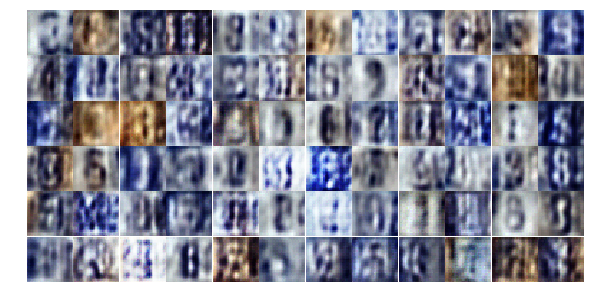

Epoch 2/10... Discriminator Loss: 0.5282... Generator Loss: 1.6024
Epoch 2/10... Discriminator Loss: 1.4106... Generator Loss: 0.9390
Epoch 2/10... Discriminator Loss: 0.8350... Generator Loss: 1.0889
Epoch 2/10... Discriminator Loss: 0.9221... Generator Loss: 1.2965
Epoch 2/10... Discriminator Loss: 0.9352... Generator Loss: 1.2296
Epoch 2/10... Discriminator Loss: 1.1141... Generator Loss: 0.8682
Epoch 2/10... Discriminator Loss: 1.5616... Generator Loss: 2.1808
Epoch 2/10... Discriminator Loss: 1.0985... Generator Loss: 1.2292
Epoch 2/10... Discriminator Loss: 0.5219... Generator Loss: 2.6539
Epoch 2/10... Discriminator Loss: 0.9559... Generator Loss: 1.8059


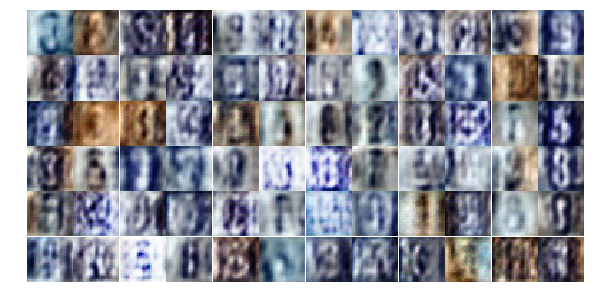

Epoch 2/10... Discriminator Loss: 0.5234... Generator Loss: 1.8006
Epoch 2/10... Discriminator Loss: 1.1888... Generator Loss: 1.1425
Epoch 2/10... Discriminator Loss: 1.3655... Generator Loss: 0.4801
Epoch 2/10... Discriminator Loss: 1.1869... Generator Loss: 0.5937
Epoch 3/10... Discriminator Loss: 0.8033... Generator Loss: 1.0984
Epoch 3/10... Discriminator Loss: 0.8497... Generator Loss: 1.4562
Epoch 3/10... Discriminator Loss: 1.3360... Generator Loss: 1.0673
Epoch 3/10... Discriminator Loss: 1.1443... Generator Loss: 0.6285
Epoch 3/10... Discriminator Loss: 0.9058... Generator Loss: 1.2215
Epoch 3/10... Discriminator Loss: 0.7060... Generator Loss: 1.1067


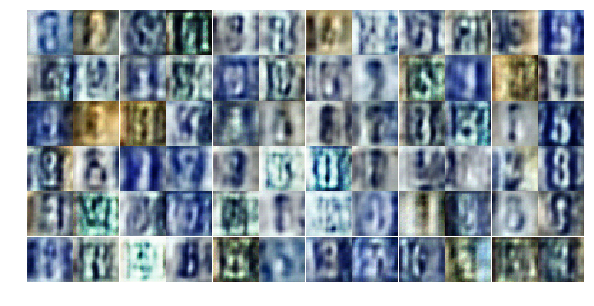

Epoch 3/10... Discriminator Loss: 0.7227... Generator Loss: 0.9767
Epoch 3/10... Discriminator Loss: 0.9484... Generator Loss: 1.3179
Epoch 3/10... Discriminator Loss: 0.9915... Generator Loss: 1.3022
Epoch 3/10... Discriminator Loss: 0.7093... Generator Loss: 1.3305
Epoch 3/10... Discriminator Loss: 0.8117... Generator Loss: 0.7983
Epoch 3/10... Discriminator Loss: 0.7855... Generator Loss: 1.3256
Epoch 3/10... Discriminator Loss: 0.4572... Generator Loss: 1.5945
Epoch 3/10... Discriminator Loss: 0.5113... Generator Loss: 1.6669
Epoch 3/10... Discriminator Loss: 1.2119... Generator Loss: 0.6832
Epoch 3/10... Discriminator Loss: 1.4447... Generator Loss: 0.4515


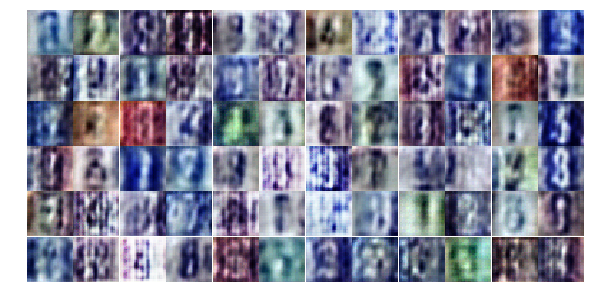

Epoch 3/10... Discriminator Loss: 0.8337... Generator Loss: 1.4093
Epoch 3/10... Discriminator Loss: 0.7523... Generator Loss: 1.8256
Epoch 3/10... Discriminator Loss: 1.0764... Generator Loss: 0.6389
Epoch 3/10... Discriminator Loss: 0.7516... Generator Loss: 1.3619
Epoch 3/10... Discriminator Loss: 1.1621... Generator Loss: 0.7117
Epoch 3/10... Discriminator Loss: 0.5129... Generator Loss: 1.7460
Epoch 3/10... Discriminator Loss: 0.9630... Generator Loss: 3.2050
Epoch 3/10... Discriminator Loss: 1.2048... Generator Loss: 0.5033
Epoch 3/10... Discriminator Loss: 0.5370... Generator Loss: 1.4199
Epoch 3/10... Discriminator Loss: 0.3426... Generator Loss: 1.8844


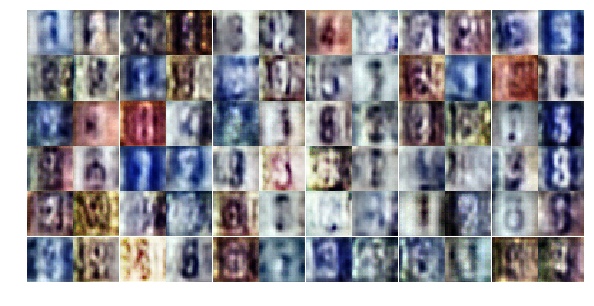

Epoch 3/10... Discriminator Loss: 1.1056... Generator Loss: 2.5855
Epoch 3/10... Discriminator Loss: 1.2594... Generator Loss: 0.4552
Epoch 3/10... Discriminator Loss: 0.7378... Generator Loss: 1.2010
Epoch 3/10... Discriminator Loss: 0.9644... Generator Loss: 2.1107
Epoch 3/10... Discriminator Loss: 0.8406... Generator Loss: 1.2357
Epoch 3/10... Discriminator Loss: 0.6727... Generator Loss: 1.3325
Epoch 3/10... Discriminator Loss: 0.5707... Generator Loss: 1.7742
Epoch 3/10... Discriminator Loss: 0.5869... Generator Loss: 1.4785
Epoch 3/10... Discriminator Loss: 0.5392... Generator Loss: 1.4935
Epoch 3/10... Discriminator Loss: 0.9894... Generator Loss: 0.6675


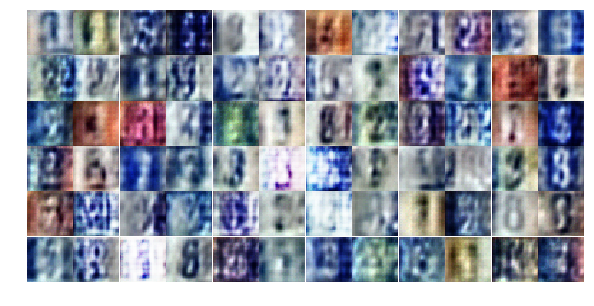

Epoch 3/10... Discriminator Loss: 0.8199... Generator Loss: 2.0913
Epoch 3/10... Discriminator Loss: 0.7723... Generator Loss: 1.1603
Epoch 3/10... Discriminator Loss: 1.0061... Generator Loss: 0.8075
Epoch 3/10... Discriminator Loss: 1.1283... Generator Loss: 0.5136
Epoch 3/10... Discriminator Loss: 0.3694... Generator Loss: 2.0204
Epoch 3/10... Discriminator Loss: 0.5745... Generator Loss: 1.8726
Epoch 3/10... Discriminator Loss: 0.7323... Generator Loss: 1.6232
Epoch 3/10... Discriminator Loss: 1.0877... Generator Loss: 0.6179
Epoch 3/10... Discriminator Loss: 0.8148... Generator Loss: 1.7393
Epoch 3/10... Discriminator Loss: 0.7204... Generator Loss: 1.8824


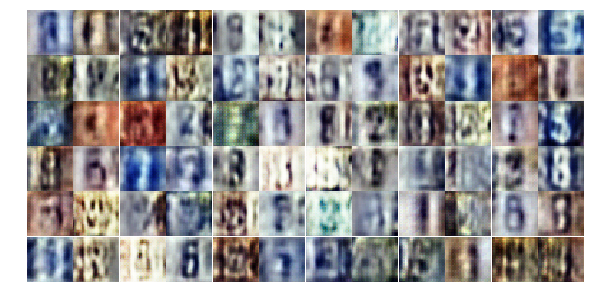

Epoch 3/10... Discriminator Loss: 0.7005... Generator Loss: 1.8694
Epoch 3/10... Discriminator Loss: 0.3946... Generator Loss: 2.9050
Epoch 3/10... Discriminator Loss: 0.6559... Generator Loss: 1.2692
Epoch 3/10... Discriminator Loss: 0.3504... Generator Loss: 1.9607
Epoch 3/10... Discriminator Loss: 1.7171... Generator Loss: 3.6169
Epoch 3/10... Discriminator Loss: 0.2568... Generator Loss: 2.2682
Epoch 3/10... Discriminator Loss: 0.6179... Generator Loss: 4.3873
Epoch 3/10... Discriminator Loss: 0.4884... Generator Loss: 2.3305
Epoch 3/10... Discriminator Loss: 0.3533... Generator Loss: 2.5886
Epoch 3/10... Discriminator Loss: 0.6979... Generator Loss: 1.4256


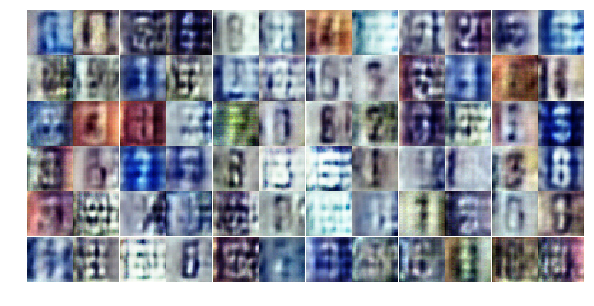

Epoch 3/10... Discriminator Loss: 1.6485... Generator Loss: 0.3288
Epoch 4/10... Discriminator Loss: 0.3420... Generator Loss: 2.2108
Epoch 4/10... Discriminator Loss: 0.8921... Generator Loss: 0.7357
Epoch 4/10... Discriminator Loss: 1.0250... Generator Loss: 0.8491
Epoch 4/10... Discriminator Loss: 0.6519... Generator Loss: 1.0949
Epoch 4/10... Discriminator Loss: 0.5838... Generator Loss: 2.4104
Epoch 4/10... Discriminator Loss: 0.3843... Generator Loss: 3.6479
Epoch 4/10... Discriminator Loss: 0.6078... Generator Loss: 1.2284
Epoch 4/10... Discriminator Loss: 0.9113... Generator Loss: 0.6741
Epoch 4/10... Discriminator Loss: 0.5519... Generator Loss: 1.4260


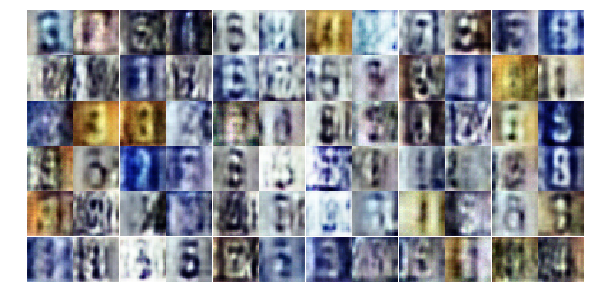

Epoch 4/10... Discriminator Loss: 0.5388... Generator Loss: 1.9814
Epoch 4/10... Discriminator Loss: 1.1099... Generator Loss: 4.9364
Epoch 4/10... Discriminator Loss: 0.6355... Generator Loss: 1.3576
Epoch 4/10... Discriminator Loss: 0.3131... Generator Loss: 1.8498
Epoch 4/10... Discriminator Loss: 0.6816... Generator Loss: 1.7484
Epoch 4/10... Discriminator Loss: 0.7055... Generator Loss: 0.9012
Epoch 4/10... Discriminator Loss: 0.7838... Generator Loss: 0.9865
Epoch 4/10... Discriminator Loss: 1.7325... Generator Loss: 0.3947
Epoch 4/10... Discriminator Loss: 1.4728... Generator Loss: 0.4979
Epoch 4/10... Discriminator Loss: 0.5193... Generator Loss: 2.5485


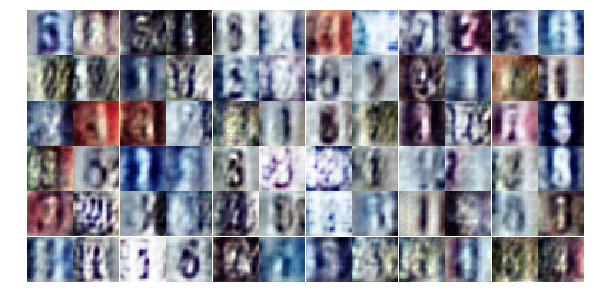

Epoch 4/10... Discriminator Loss: 0.5537... Generator Loss: 2.0750
Epoch 4/10... Discriminator Loss: 0.4216... Generator Loss: 2.2422
Epoch 4/10... Discriminator Loss: 0.5096... Generator Loss: 1.5983
Epoch 4/10... Discriminator Loss: 0.5811... Generator Loss: 1.6707
Epoch 4/10... Discriminator Loss: 0.9471... Generator Loss: 0.8117
Epoch 4/10... Discriminator Loss: 0.5796... Generator Loss: 2.8546
Epoch 4/10... Discriminator Loss: 0.7263... Generator Loss: 0.9886
Epoch 4/10... Discriminator Loss: 0.6964... Generator Loss: 0.9819
Epoch 4/10... Discriminator Loss: 0.5335... Generator Loss: 2.9122
Epoch 4/10... Discriminator Loss: 0.5777... Generator Loss: 1.5253


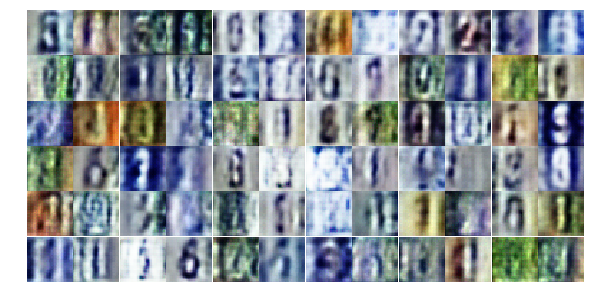

Epoch 4/10... Discriminator Loss: 0.5168... Generator Loss: 2.4933
Epoch 4/10... Discriminator Loss: 0.5390... Generator Loss: 1.7696
Epoch 4/10... Discriminator Loss: 0.6363... Generator Loss: 1.8810
Epoch 4/10... Discriminator Loss: 0.5500... Generator Loss: 1.6572
Epoch 4/10... Discriminator Loss: 0.2955... Generator Loss: 2.8394
Epoch 4/10... Discriminator Loss: 0.5753... Generator Loss: 2.3450
Epoch 4/10... Discriminator Loss: 0.6646... Generator Loss: 1.1929
Epoch 4/10... Discriminator Loss: 0.6142... Generator Loss: 1.4884
Epoch 4/10... Discriminator Loss: 0.5797... Generator Loss: 1.6987
Epoch 4/10... Discriminator Loss: 1.0270... Generator Loss: 0.6762


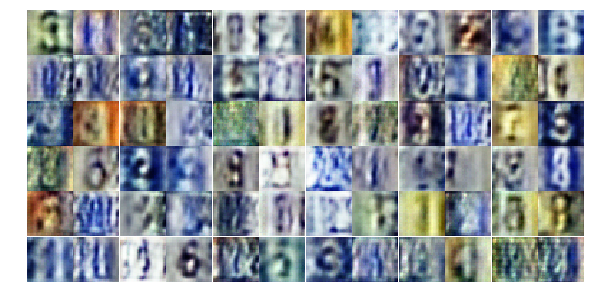

Epoch 4/10... Discriminator Loss: 0.7804... Generator Loss: 0.9110
Epoch 4/10... Discriminator Loss: 0.8278... Generator Loss: 0.9001
Epoch 4/10... Discriminator Loss: 0.6268... Generator Loss: 1.5594
Epoch 4/10... Discriminator Loss: 0.4533... Generator Loss: 1.5569
Epoch 4/10... Discriminator Loss: 0.5540... Generator Loss: 2.1873
Epoch 4/10... Discriminator Loss: 2.1931... Generator Loss: 2.8053
Epoch 4/10... Discriminator Loss: 0.9285... Generator Loss: 0.7997
Epoch 4/10... Discriminator Loss: 1.0203... Generator Loss: 1.3617
Epoch 4/10... Discriminator Loss: 0.7182... Generator Loss: 1.0423
Epoch 4/10... Discriminator Loss: 0.4842... Generator Loss: 1.8719


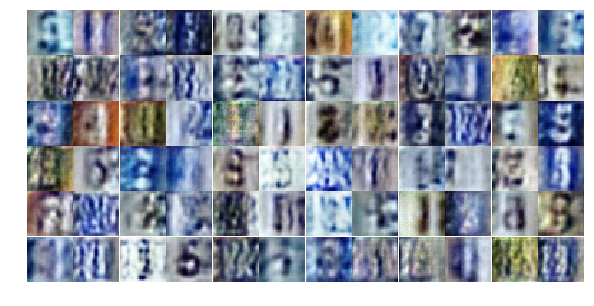

Epoch 4/10... Discriminator Loss: 0.5279... Generator Loss: 2.1421
Epoch 4/10... Discriminator Loss: 0.6164... Generator Loss: 2.1081
Epoch 4/10... Discriminator Loss: 0.3486... Generator Loss: 2.3608
Epoch 4/10... Discriminator Loss: 0.4840... Generator Loss: 1.6673
Epoch 4/10... Discriminator Loss: 0.4431... Generator Loss: 1.8174
Epoch 4/10... Discriminator Loss: 0.4857... Generator Loss: 1.6479
Epoch 4/10... Discriminator Loss: 0.5238... Generator Loss: 1.3186
Epoch 4/10... Discriminator Loss: 0.6461... Generator Loss: 1.2175
Epoch 4/10... Discriminator Loss: 0.6502... Generator Loss: 1.3853
Epoch 5/10... Discriminator Loss: 0.6510... Generator Loss: 1.6688


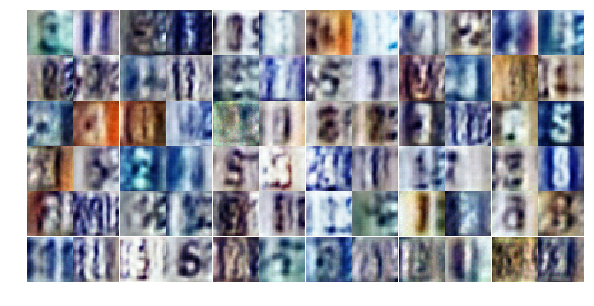

Epoch 5/10... Discriminator Loss: 0.5716... Generator Loss: 1.3341
Epoch 5/10... Discriminator Loss: 0.6227... Generator Loss: 1.4081
Epoch 5/10... Discriminator Loss: 0.6282... Generator Loss: 1.2430
Epoch 5/10... Discriminator Loss: 0.5084... Generator Loss: 1.3041
Epoch 5/10... Discriminator Loss: 0.3827... Generator Loss: 2.7495
Epoch 5/10... Discriminator Loss: 0.5846... Generator Loss: 1.9307
Epoch 5/10... Discriminator Loss: 1.0079... Generator Loss: 0.6590
Epoch 5/10... Discriminator Loss: 0.7092... Generator Loss: 1.6328
Epoch 5/10... Discriminator Loss: 0.9580... Generator Loss: 2.8148
Epoch 5/10... Discriminator Loss: 0.9569... Generator Loss: 0.7136


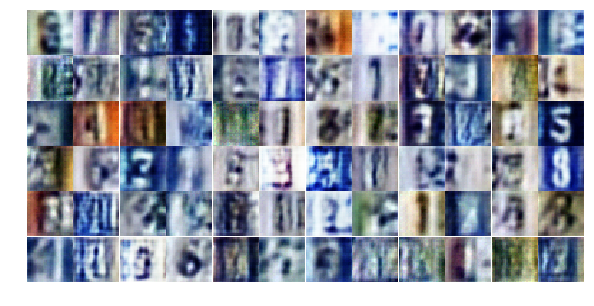

Epoch 5/10... Discriminator Loss: 0.6650... Generator Loss: 1.7898
Epoch 5/10... Discriminator Loss: 0.7003... Generator Loss: 0.9972
Epoch 5/10... Discriminator Loss: 0.2995... Generator Loss: 2.3249
Epoch 5/10... Discriminator Loss: 0.4247... Generator Loss: 2.1288
Epoch 5/10... Discriminator Loss: 0.5371... Generator Loss: 1.2936
Epoch 5/10... Discriminator Loss: 1.5352... Generator Loss: 0.3366
Epoch 5/10... Discriminator Loss: 0.7831... Generator Loss: 0.9569
Epoch 5/10... Discriminator Loss: 0.6375... Generator Loss: 1.3949
Epoch 5/10... Discriminator Loss: 0.6270... Generator Loss: 1.1190
Epoch 5/10... Discriminator Loss: 0.4628... Generator Loss: 1.9219


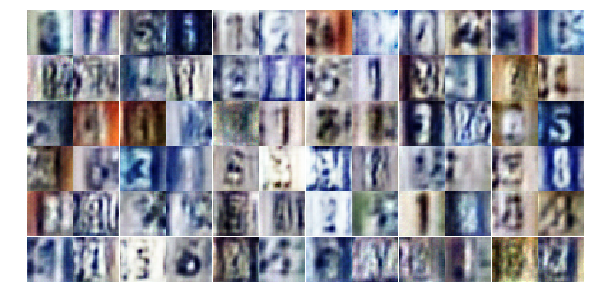

Epoch 5/10... Discriminator Loss: 0.4927... Generator Loss: 1.4271
Epoch 5/10... Discriminator Loss: 0.6088... Generator Loss: 1.3505
Epoch 5/10... Discriminator Loss: 0.4274... Generator Loss: 1.9297
Epoch 5/10... Discriminator Loss: 0.7127... Generator Loss: 2.0767
Epoch 5/10... Discriminator Loss: 1.0005... Generator Loss: 0.7134
Epoch 5/10... Discriminator Loss: 0.8204... Generator Loss: 0.7685
Epoch 5/10... Discriminator Loss: 0.7163... Generator Loss: 0.8666
Epoch 5/10... Discriminator Loss: 0.4443... Generator Loss: 1.5964
Epoch 5/10... Discriminator Loss: 0.8369... Generator Loss: 0.9911
Epoch 5/10... Discriminator Loss: 1.1981... Generator Loss: 2.9379


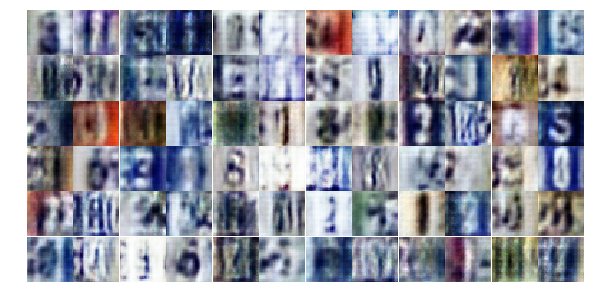

Epoch 5/10... Discriminator Loss: 0.6214... Generator Loss: 2.2900
Epoch 5/10... Discriminator Loss: 0.5049... Generator Loss: 1.3469
Epoch 5/10... Discriminator Loss: 0.6001... Generator Loss: 1.5073
Epoch 5/10... Discriminator Loss: 0.5686... Generator Loss: 1.2155
Epoch 5/10... Discriminator Loss: 0.6733... Generator Loss: 1.7642
Epoch 5/10... Discriminator Loss: 0.4470... Generator Loss: 1.8451
Epoch 5/10... Discriminator Loss: 0.6783... Generator Loss: 1.0193
Epoch 5/10... Discriminator Loss: 0.4273... Generator Loss: 1.4532
Epoch 5/10... Discriminator Loss: 0.6935... Generator Loss: 1.0599
Epoch 5/10... Discriminator Loss: 0.3347... Generator Loss: 1.9808


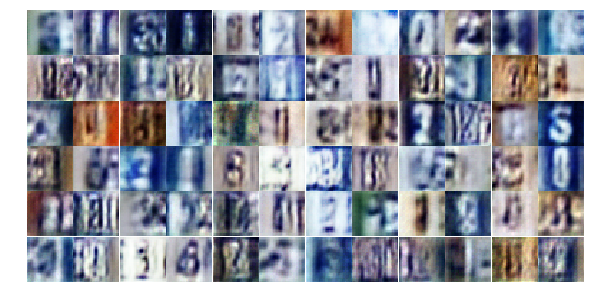

Epoch 5/10... Discriminator Loss: 0.3028... Generator Loss: 2.1052
Epoch 5/10... Discriminator Loss: 0.4090... Generator Loss: 1.5491
Epoch 5/10... Discriminator Loss: 0.7066... Generator Loss: 1.0391
Epoch 5/10... Discriminator Loss: 0.3524... Generator Loss: 1.8858
Epoch 5/10... Discriminator Loss: 1.0691... Generator Loss: 1.2337
Epoch 5/10... Discriminator Loss: 1.0743... Generator Loss: 0.5578
Epoch 5/10... Discriminator Loss: 0.6710... Generator Loss: 1.2788
Epoch 5/10... Discriminator Loss: 0.6648... Generator Loss: 1.1646
Epoch 5/10... Discriminator Loss: 0.4939... Generator Loss: 1.5536
Epoch 5/10... Discriminator Loss: 0.5202... Generator Loss: 2.1929


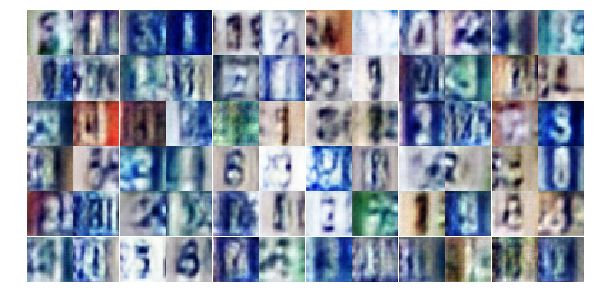

Epoch 5/10... Discriminator Loss: 1.0815... Generator Loss: 0.5885
Epoch 5/10... Discriminator Loss: 0.5031... Generator Loss: 1.5466
Epoch 5/10... Discriminator Loss: 0.8009... Generator Loss: 0.8364
Epoch 5/10... Discriminator Loss: 0.4319... Generator Loss: 1.5355
Epoch 5/10... Discriminator Loss: 0.4043... Generator Loss: 1.6978
Epoch 5/10... Discriminator Loss: 0.8193... Generator Loss: 0.8239
Epoch 6/10... Discriminator Loss: 0.5403... Generator Loss: 1.2321
Epoch 6/10... Discriminator Loss: 0.2574... Generator Loss: 2.2962
Epoch 6/10... Discriminator Loss: 0.5593... Generator Loss: 1.2876
Epoch 6/10... Discriminator Loss: 0.5318... Generator Loss: 1.2612


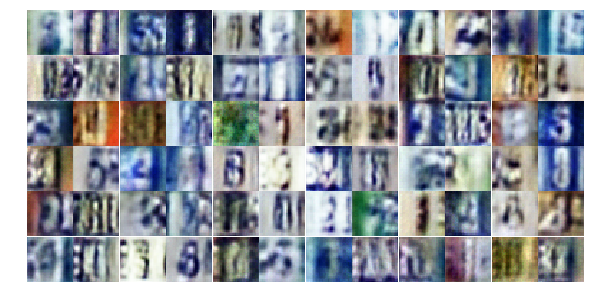

Epoch 6/10... Discriminator Loss: 0.8064... Generator Loss: 0.8039
Epoch 6/10... Discriminator Loss: 1.2819... Generator Loss: 0.7677
Epoch 6/10... Discriminator Loss: 0.8271... Generator Loss: 0.7880
Epoch 6/10... Discriminator Loss: 1.3788... Generator Loss: 0.5351
Epoch 6/10... Discriminator Loss: 0.6521... Generator Loss: 1.0751
Epoch 6/10... Discriminator Loss: 0.5500... Generator Loss: 1.2198
Epoch 6/10... Discriminator Loss: 0.4529... Generator Loss: 2.2382
Epoch 6/10... Discriminator Loss: 1.3043... Generator Loss: 0.4511
Epoch 6/10... Discriminator Loss: 0.8641... Generator Loss: 0.8364
Epoch 6/10... Discriminator Loss: 0.7192... Generator Loss: 1.0187


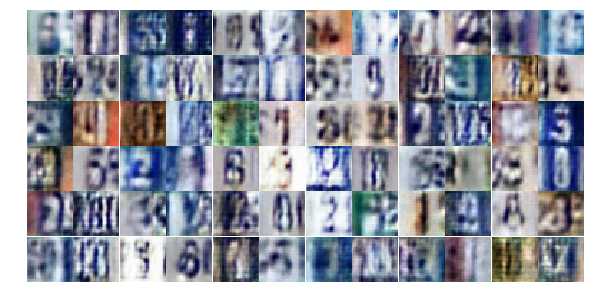

Epoch 6/10... Discriminator Loss: 0.5203... Generator Loss: 2.4107
Epoch 6/10... Discriminator Loss: 3.0866... Generator Loss: 0.1391
Epoch 6/10... Discriminator Loss: 0.6107... Generator Loss: 3.0388
Epoch 6/10... Discriminator Loss: 0.7268... Generator Loss: 0.9564
Epoch 6/10... Discriminator Loss: 0.5111... Generator Loss: 1.4405
Epoch 6/10... Discriminator Loss: 0.4965... Generator Loss: 1.5641
Epoch 6/10... Discriminator Loss: 0.5333... Generator Loss: 1.2940
Epoch 6/10... Discriminator Loss: 0.8220... Generator Loss: 0.8189
Epoch 6/10... Discriminator Loss: 0.8249... Generator Loss: 2.7764
Epoch 6/10... Discriminator Loss: 0.6320... Generator Loss: 1.1378


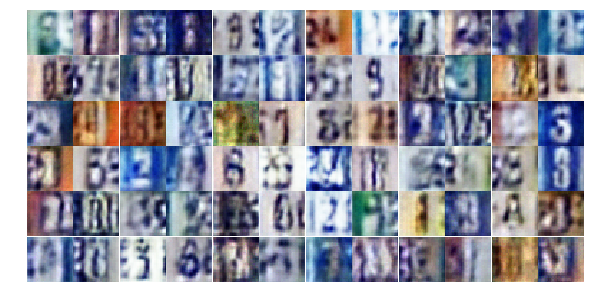

Epoch 6/10... Discriminator Loss: 0.6304... Generator Loss: 1.0522
Epoch 6/10... Discriminator Loss: 0.5531... Generator Loss: 1.2781
Epoch 6/10... Discriminator Loss: 0.9186... Generator Loss: 0.7595
Epoch 6/10... Discriminator Loss: 0.6658... Generator Loss: 1.0083
Epoch 6/10... Discriminator Loss: 0.5446... Generator Loss: 2.7510
Epoch 6/10... Discriminator Loss: 1.5826... Generator Loss: 0.4589
Epoch 6/10... Discriminator Loss: 1.0079... Generator Loss: 0.6281
Epoch 6/10... Discriminator Loss: 0.3650... Generator Loss: 1.6896
Epoch 6/10... Discriminator Loss: 0.6331... Generator Loss: 1.1401
Epoch 6/10... Discriminator Loss: 0.4576... Generator Loss: 1.5658


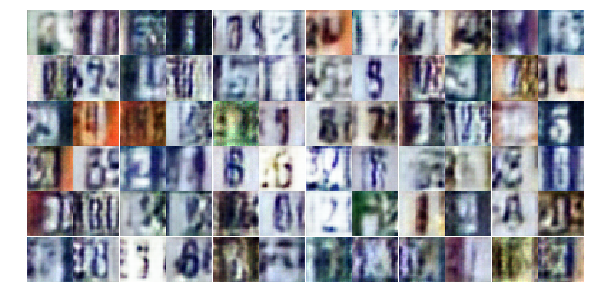

Epoch 6/10... Discriminator Loss: 1.1952... Generator Loss: 0.8117
Epoch 6/10... Discriminator Loss: 0.9553... Generator Loss: 2.4889
Epoch 6/10... Discriminator Loss: 0.7502... Generator Loss: 1.0251
Epoch 6/10... Discriminator Loss: 0.4981... Generator Loss: 1.7245
Epoch 6/10... Discriminator Loss: 0.6553... Generator Loss: 1.0345
Epoch 6/10... Discriminator Loss: 0.7143... Generator Loss: 0.8813
Epoch 6/10... Discriminator Loss: 0.4633... Generator Loss: 1.6321
Epoch 6/10... Discriminator Loss: 0.7079... Generator Loss: 3.1612
Epoch 6/10... Discriminator Loss: 0.8014... Generator Loss: 0.7614
Epoch 6/10... Discriminator Loss: 0.4625... Generator Loss: 1.3757


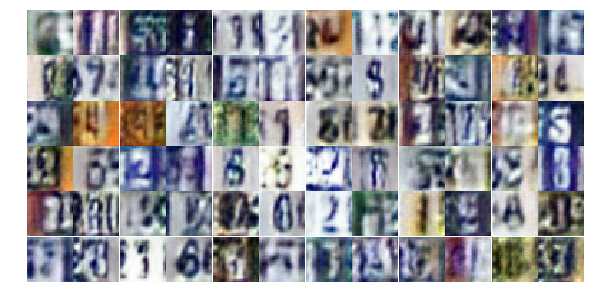

Epoch 6/10... Discriminator Loss: 1.1085... Generator Loss: 0.5504
Epoch 6/10... Discriminator Loss: 0.6531... Generator Loss: 1.0277
Epoch 6/10... Discriminator Loss: 1.0782... Generator Loss: 0.5595
Epoch 6/10... Discriminator Loss: 0.7242... Generator Loss: 2.9698
Epoch 6/10... Discriminator Loss: 0.5061... Generator Loss: 1.9607
Epoch 6/10... Discriminator Loss: 0.4848... Generator Loss: 1.2417
Epoch 6/10... Discriminator Loss: 0.5074... Generator Loss: 1.4552
Epoch 6/10... Discriminator Loss: 1.7458... Generator Loss: 0.3067
Epoch 6/10... Discriminator Loss: 0.6554... Generator Loss: 1.1169
Epoch 6/10... Discriminator Loss: 1.0081... Generator Loss: 0.6641


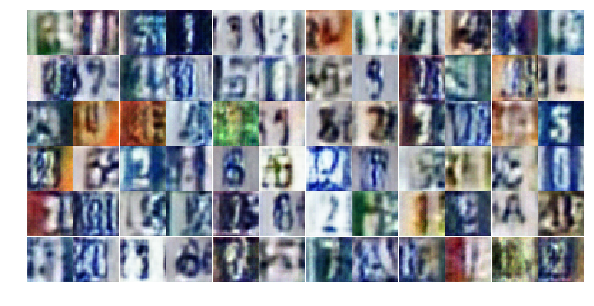

Epoch 6/10... Discriminator Loss: 0.5660... Generator Loss: 1.3635
Epoch 6/10... Discriminator Loss: 0.4726... Generator Loss: 1.6762
Epoch 6/10... Discriminator Loss: 0.6542... Generator Loss: 1.9382
Epoch 7/10... Discriminator Loss: 0.6856... Generator Loss: 1.0033
Epoch 7/10... Discriminator Loss: 0.5691... Generator Loss: 1.2979
Epoch 7/10... Discriminator Loss: 0.4350... Generator Loss: 2.1167
Epoch 7/10... Discriminator Loss: 0.5739... Generator Loss: 1.5211
Epoch 7/10... Discriminator Loss: 0.5989... Generator Loss: 1.2883
Epoch 7/10... Discriminator Loss: 0.5179... Generator Loss: 1.6904
Epoch 7/10... Discriminator Loss: 0.9736... Generator Loss: 0.6855


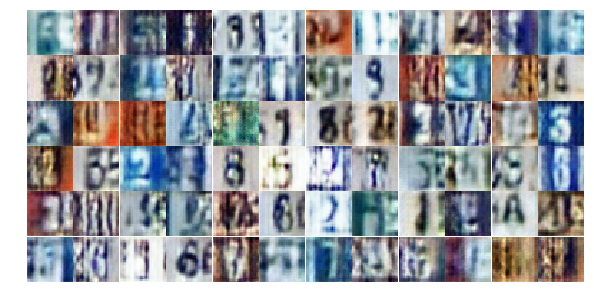

Epoch 7/10... Discriminator Loss: 0.5669... Generator Loss: 1.7864
Epoch 7/10... Discriminator Loss: 0.6967... Generator Loss: 1.0071
Epoch 7/10... Discriminator Loss: 0.5085... Generator Loss: 1.3269
Epoch 7/10... Discriminator Loss: 0.6347... Generator Loss: 1.3799
Epoch 7/10... Discriminator Loss: 0.3960... Generator Loss: 1.7312
Epoch 7/10... Discriminator Loss: 0.3228... Generator Loss: 1.8636
Epoch 7/10... Discriminator Loss: 0.8217... Generator Loss: 0.8922
Epoch 7/10... Discriminator Loss: 1.1167... Generator Loss: 3.0013
Epoch 7/10... Discriminator Loss: 1.6489... Generator Loss: 3.2580
Epoch 7/10... Discriminator Loss: 0.6190... Generator Loss: 1.7030


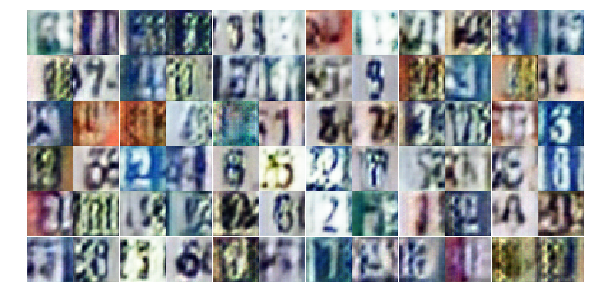

Epoch 7/10... Discriminator Loss: 0.5744... Generator Loss: 1.6200
Epoch 7/10... Discriminator Loss: 0.3015... Generator Loss: 2.4912
Epoch 7/10... Discriminator Loss: 0.9552... Generator Loss: 0.7469
Epoch 7/10... Discriminator Loss: 0.6510... Generator Loss: 1.2566
Epoch 7/10... Discriminator Loss: 0.5070... Generator Loss: 1.5563
Epoch 7/10... Discriminator Loss: 0.5582... Generator Loss: 2.1610
Epoch 7/10... Discriminator Loss: 0.8430... Generator Loss: 0.8057
Epoch 7/10... Discriminator Loss: 0.9375... Generator Loss: 0.7843
Epoch 7/10... Discriminator Loss: 0.3571... Generator Loss: 1.9030
Epoch 7/10... Discriminator Loss: 0.5748... Generator Loss: 1.1529


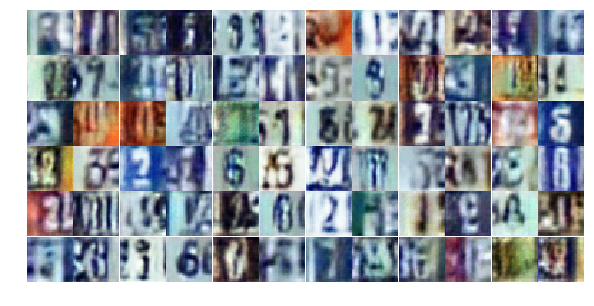

Epoch 7/10... Discriminator Loss: 0.6982... Generator Loss: 1.0246
Epoch 7/10... Discriminator Loss: 1.7226... Generator Loss: 0.2944
Epoch 7/10... Discriminator Loss: 0.6232... Generator Loss: 1.0811
Epoch 7/10... Discriminator Loss: 0.7633... Generator Loss: 0.9063
Epoch 7/10... Discriminator Loss: 0.6775... Generator Loss: 1.0688
Epoch 7/10... Discriminator Loss: 0.9386... Generator Loss: 0.8455
Epoch 7/10... Discriminator Loss: 0.3306... Generator Loss: 1.8245
Epoch 7/10... Discriminator Loss: 0.7739... Generator Loss: 0.8501
Epoch 7/10... Discriminator Loss: 1.0629... Generator Loss: 0.6054
Epoch 7/10... Discriminator Loss: 0.5872... Generator Loss: 1.9012


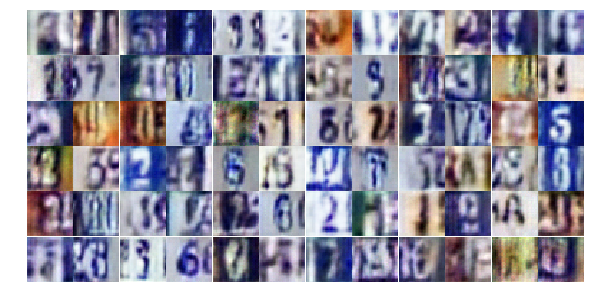

Epoch 7/10... Discriminator Loss: 0.7188... Generator Loss: 1.3607
Epoch 7/10... Discriminator Loss: 0.4044... Generator Loss: 1.6459
Epoch 7/10... Discriminator Loss: 0.5521... Generator Loss: 1.6040
Epoch 7/10... Discriminator Loss: 0.7320... Generator Loss: 2.2561
Epoch 7/10... Discriminator Loss: 0.6986... Generator Loss: 1.0610
Epoch 7/10... Discriminator Loss: 0.5336... Generator Loss: 1.2582
Epoch 7/10... Discriminator Loss: 0.4300... Generator Loss: 1.4280
Epoch 7/10... Discriminator Loss: 0.7515... Generator Loss: 1.4336
Epoch 7/10... Discriminator Loss: 0.4311... Generator Loss: 2.7588
Epoch 7/10... Discriminator Loss: 0.6774... Generator Loss: 1.2781


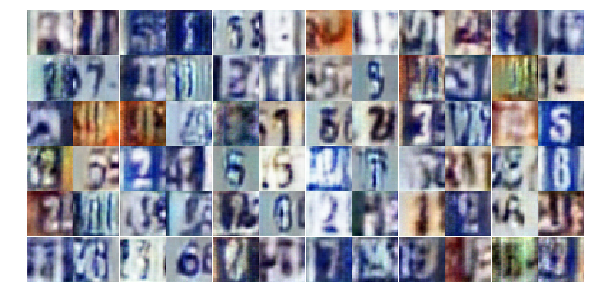

Epoch 7/10... Discriminator Loss: 0.4022... Generator Loss: 1.5614
Epoch 7/10... Discriminator Loss: 0.5003... Generator Loss: 1.3032
Epoch 7/10... Discriminator Loss: 0.6368... Generator Loss: 1.5724
Epoch 7/10... Discriminator Loss: 0.5906... Generator Loss: 1.6504
Epoch 7/10... Discriminator Loss: 0.7187... Generator Loss: 0.9492
Epoch 7/10... Discriminator Loss: 0.7539... Generator Loss: 1.0968
Epoch 7/10... Discriminator Loss: 1.1021... Generator Loss: 0.6288
Epoch 7/10... Discriminator Loss: 0.5879... Generator Loss: 1.3855
Epoch 7/10... Discriminator Loss: 0.9762... Generator Loss: 0.6441
Epoch 7/10... Discriminator Loss: 0.9822... Generator Loss: 0.6566


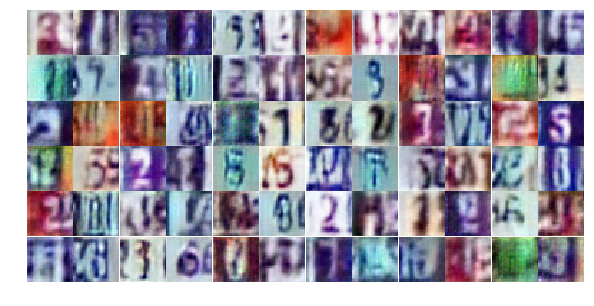

Epoch 7/10... Discriminator Loss: 0.4719... Generator Loss: 1.9929
Epoch 8/10... Discriminator Loss: 0.6017... Generator Loss: 1.2802
Epoch 8/10... Discriminator Loss: 1.2408... Generator Loss: 0.4756
Epoch 8/10... Discriminator Loss: 0.7452... Generator Loss: 1.0932
Epoch 8/10... Discriminator Loss: 0.5347... Generator Loss: 1.3555
Epoch 8/10... Discriminator Loss: 0.7340... Generator Loss: 0.9220
Epoch 8/10... Discriminator Loss: 0.5803... Generator Loss: 1.2534
Epoch 8/10... Discriminator Loss: 0.4715... Generator Loss: 1.9761
Epoch 8/10... Discriminator Loss: 0.5727... Generator Loss: 1.4570
Epoch 8/10... Discriminator Loss: 0.6913... Generator Loss: 0.8973


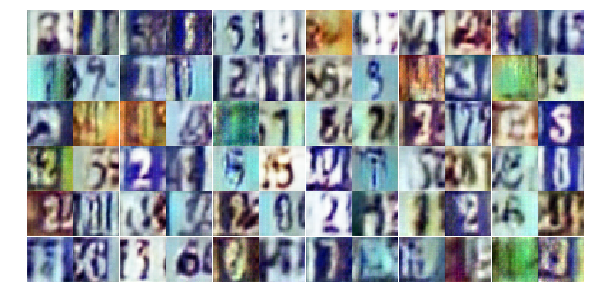

Epoch 8/10... Discriminator Loss: 0.4308... Generator Loss: 1.4997
Epoch 8/10... Discriminator Loss: 0.3482... Generator Loss: 1.9793
Epoch 8/10... Discriminator Loss: 0.5242... Generator Loss: 1.8542
Epoch 8/10... Discriminator Loss: 0.3300... Generator Loss: 1.8521
Epoch 8/10... Discriminator Loss: 0.7003... Generator Loss: 1.0076
Epoch 8/10... Discriminator Loss: 1.5314... Generator Loss: 3.7219
Epoch 8/10... Discriminator Loss: 0.6045... Generator Loss: 1.6834
Epoch 8/10... Discriminator Loss: 0.4873... Generator Loss: 1.4173
Epoch 8/10... Discriminator Loss: 0.5996... Generator Loss: 1.3118
Epoch 8/10... Discriminator Loss: 1.1728... Generator Loss: 0.4925


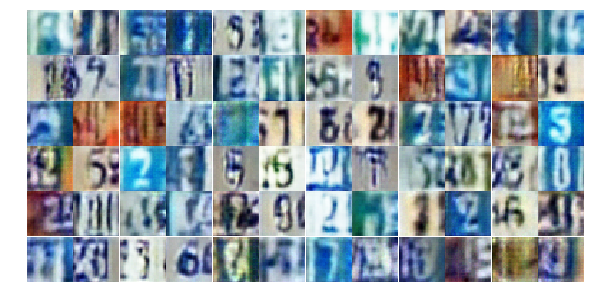

Epoch 8/10... Discriminator Loss: 0.4253... Generator Loss: 1.8141
Epoch 8/10... Discriminator Loss: 0.8110... Generator Loss: 0.7902
Epoch 8/10... Discriminator Loss: 0.7686... Generator Loss: 0.9351
Epoch 8/10... Discriminator Loss: 0.5441... Generator Loss: 1.3087
Epoch 8/10... Discriminator Loss: 0.4767... Generator Loss: 2.6219
Epoch 8/10... Discriminator Loss: 0.4809... Generator Loss: 1.4503
Epoch 8/10... Discriminator Loss: 0.5833... Generator Loss: 1.3536
Epoch 8/10... Discriminator Loss: 0.3191... Generator Loss: 1.7255
Epoch 8/10... Discriminator Loss: 1.1090... Generator Loss: 1.5680
Epoch 8/10... Discriminator Loss: 1.0560... Generator Loss: 0.6204


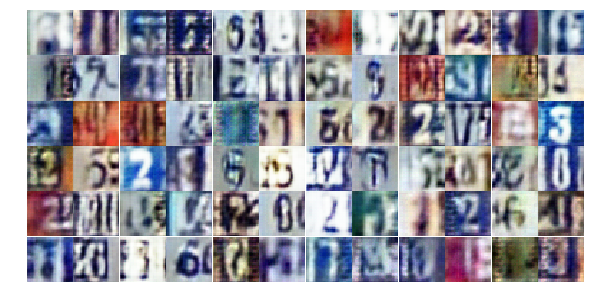

Epoch 8/10... Discriminator Loss: 0.7582... Generator Loss: 0.9797
Epoch 8/10... Discriminator Loss: 0.6153... Generator Loss: 1.2496
Epoch 8/10... Discriminator Loss: 0.5153... Generator Loss: 1.4096
Epoch 8/10... Discriminator Loss: 0.6308... Generator Loss: 1.0820
Epoch 8/10... Discriminator Loss: 0.8881... Generator Loss: 0.7342
Epoch 8/10... Discriminator Loss: 0.4591... Generator Loss: 1.3383
Epoch 8/10... Discriminator Loss: 0.5896... Generator Loss: 1.3090
Epoch 8/10... Discriminator Loss: 0.6589... Generator Loss: 1.0978
Epoch 8/10... Discriminator Loss: 0.6278... Generator Loss: 1.1517
Epoch 8/10... Discriminator Loss: 0.5177... Generator Loss: 1.2604


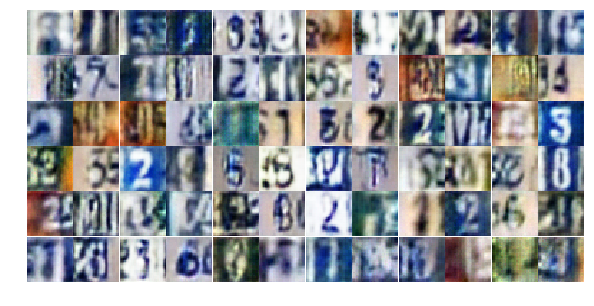

Epoch 8/10... Discriminator Loss: 0.7095... Generator Loss: 3.1182
Epoch 8/10... Discriminator Loss: 1.1929... Generator Loss: 0.5853
Epoch 8/10... Discriminator Loss: 0.9117... Generator Loss: 0.7150
Epoch 8/10... Discriminator Loss: 0.4589... Generator Loss: 1.5214
Epoch 8/10... Discriminator Loss: 1.1158... Generator Loss: 1.5446
Epoch 8/10... Discriminator Loss: 0.8472... Generator Loss: 0.7558
Epoch 8/10... Discriminator Loss: 0.3696... Generator Loss: 2.1677
Epoch 8/10... Discriminator Loss: 0.5355... Generator Loss: 1.2654
Epoch 8/10... Discriminator Loss: 0.5903... Generator Loss: 1.6280
Epoch 8/10... Discriminator Loss: 0.6061... Generator Loss: 1.4147


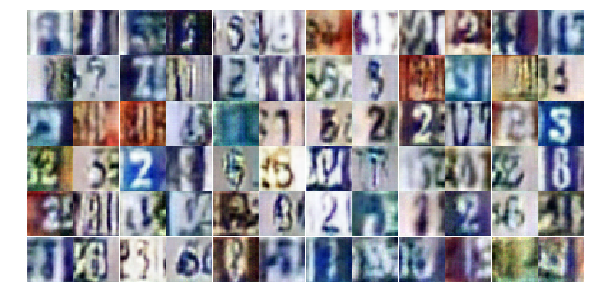

Epoch 8/10... Discriminator Loss: 0.5921... Generator Loss: 1.3568
Epoch 8/10... Discriminator Loss: 0.4071... Generator Loss: 1.6975
Epoch 8/10... Discriminator Loss: 0.5744... Generator Loss: 2.0159
Epoch 8/10... Discriminator Loss: 1.0409... Generator Loss: 0.5769
Epoch 8/10... Discriminator Loss: 0.2840... Generator Loss: 2.2144
Epoch 8/10... Discriminator Loss: 0.9790... Generator Loss: 1.1299
Epoch 8/10... Discriminator Loss: 0.4310... Generator Loss: 1.4379
Epoch 8/10... Discriminator Loss: 0.4386... Generator Loss: 1.8305
Epoch 9/10... Discriminator Loss: 1.0633... Generator Loss: 0.5698
Epoch 9/10... Discriminator Loss: 0.9987... Generator Loss: 0.6935


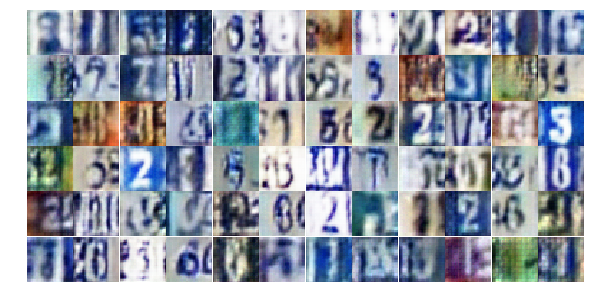

Epoch 9/10... Discriminator Loss: 0.4457... Generator Loss: 1.7264
Epoch 9/10... Discriminator Loss: 0.5195... Generator Loss: 1.4344
Epoch 9/10... Discriminator Loss: 1.1210... Generator Loss: 0.5278


In [ ]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))